In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
from sklearn.manifold import TSNE
from torchvision import models
from joblib import dump
device = "cuda" if torch.cuda.is_available() else "cpu"
device
# Load CIFAR10 dataset
transform = transforms.Compose([
    transforms.Resize(224),  # Resize to the input size expected by ResNet18
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=100, shuffle=False)

# Load pre-trained ResNet18 and remove the final classification layer
model = models.resnet18(weights='IMAGENET1K_V1')
model = torch.nn.Sequential(*(list(model.children())[:-1])).to(device) # Remove the last classification layer
model.eval()

# Extract embeddings
embeddings, labels, img = [], [], []
with torch.no_grad():
    for images, lbls in testloader:
        images,lbls = images.to(device), lbls.to(device)
        emb = model(images).squeeze(-1).squeeze(-1)  # After removing the last layer, there might be extra dimensions
        embeddings.append(emb)
        labels.append(lbls)
        img.append(images)
embeddings = torch.cat(embeddings).cpu()
labels = torch.cat(labels).cpu()
img = torch.cat(img).cpu()

# Reduce dimensionality using t-SNE
tsne = TSNE(n_components=2, random_state=0).fit_transform(embeddings)
#Save the t-SNE result
dump(tsne, 'tsne_embeddings.pkl')
torch.save(labels, 'labels.pt')
torch.save(img, 'img.pt')
torch.save(embeddings, 'embs.pt')


Files already downloaded and verified


In [2]:
from sklearn.manifold import TSNE
from joblib import load
import torch
loaded_labels = torch.load('/content/labels.pt')
loaded_img = torch.load('/content/img.pt')
# Load the t-SNE result
loaded_tsne = load('tsne_embeddings.pkl')
loaded_embeddings = torch.load('/content/embs.pt')

type(loaded_embeddings)

torch.Tensor

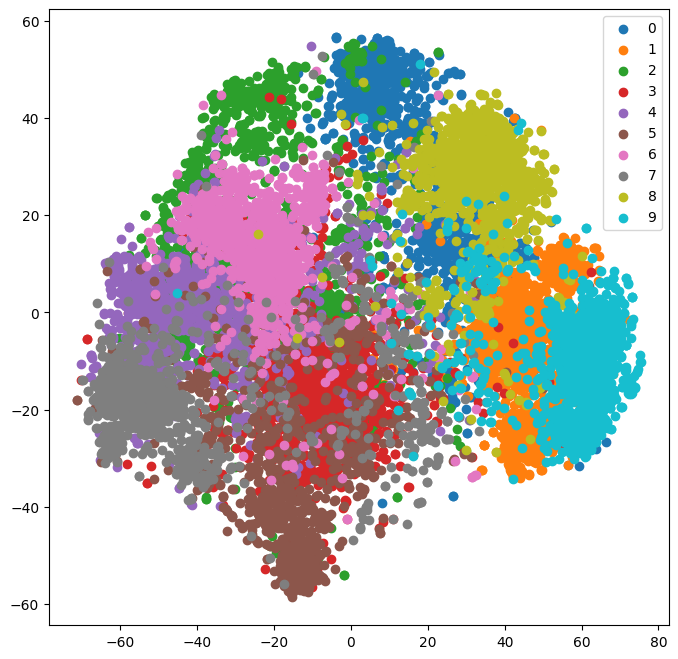

In [6]:
import matplotlib.pyplot as plt

# Plot the t-SNE reduced embeddings
plt.figure(figsize=(8, 8))
for i in range(10):
    indices = loaded_labels == i
    plt.scatter(loaded_tsne[indices, 0], loaded_tsne[indices, 1], label=str(i))
plt.legend()
plt.show()

In [ ]:
pip install umap-learn


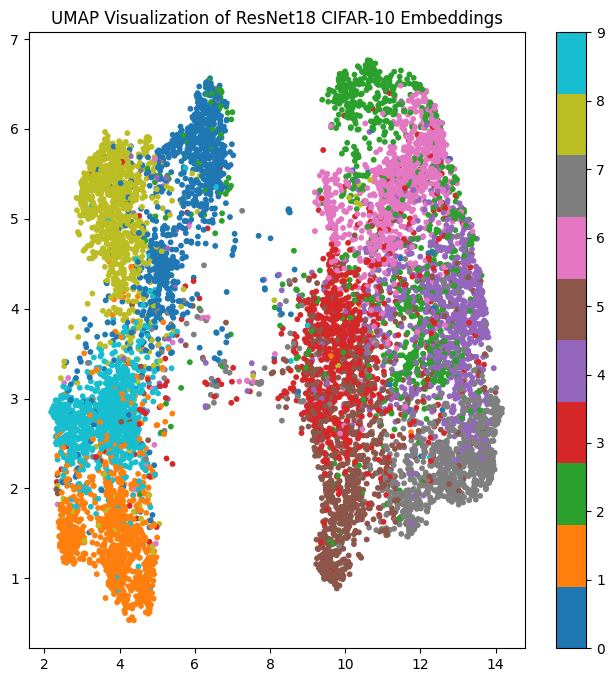

In [7]:
import umap
import matplotlib.pyplot as plt

# Use UMAP for dimensionality reduction
umap_model = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation')
reduced_embeddings = umap_model.fit_transform(loaded_embeddings)

# Plot the UMAP visualization
plt.figure(figsize=(8, 8))
plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=loaded_labels, cmap='tab10', s=10)
plt.colorbar()
plt.title("UMAP Visualization of ResNet18 CIFAR-10 Embeddings")
plt.show()

In [8]:
import os
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter
from torchvision.models import resnet18
device = "cuda" if torch.cuda.is_available() else "cpu"
device


# Create the directory if it doesn't exist
if not os.path.exists('./logs'):
    os.makedirs('./logs')


# 1. Prepare CIFAR10 data (just like before)
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=1000, shuffle=False)

# Load pre-trained ResNet18 and remove the final classification layer
model = models.resnet18(weights='IMAGENET1K_V1')
model = torch.nn.Sequential(*(list(model.children())[:-1])).to(device) # Remove the last classification layer
model.eval()

# 2. Prepare data for TensorBoard
# Write the labels and some sample images to a metadata file
metadata_file = './logs/metadata.tsv'
classes = testset.classes
with open(metadata_file, 'w') as f:
    for _, label in testloader:
        for lbl in label:
            f.write(classes[lbl] + '\n')

# 3. Log embeddings for TensorBoard
writer = SummaryWriter('./logs')
embeddings = []
with torch.no_grad():
    for images, labels in testloader:
        images,labels = images.to(device), labels.to(device)
        # Assuming `model` is your model
        embeddings = model(images).squeeze(-1).squeeze(-1)
        # Log embeddings
        writer.add_embedding(embeddings,
                             metadata=labels.tolist(),
                             label_img=images,
                             global_step=0)
        break  # This is just for one batch. Remove if you want embeddings for the entire dataset.

writer.close()


Files already downloaded and verified


In [12]:
%reload_ext tensorboard
%tensorboard --logdir ./logs

Reusing TensorBoard on port 6006 (pid 14954), started 0:00:57 ago. (Use '!kill 14954' to kill it.)

<IPython.core.display.Javascript object>